#  First resnet implementation for kavisar -  PyTorch

In [1]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy

from sklearn.metrics import confusion_matrix


plt.ion()   # interactive mode



In [2]:
data_dir = 'data_v2'
model_dir = 'pytorch_models'

In [3]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'validation': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}


#### Preparing test data

In [77]:
test_data_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [78]:
test_datasets = datasets.ImageFolder(os.path.join(data_dir, 'test'), test_data_transforms)

In [79]:
print(len(test_datasets))

1600


In [91]:
test_dataloader = torch.utils.data.DataLoader(test_datasets, batch_size=64, shuffle=False, num_workers=4)

In [86]:
test_datasets.classes

['dyed-lifted-polyps',
 'dyed-resection-margins',
 'esophagitis',
 'normal-cecum',
 'normal-pylorus',
 'normal-z-line',
 'polyps',
 'ulcerative-colitis']

In [4]:
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'validation']}

In [5]:
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=64,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'validation']}

In [6]:
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation']}

In [7]:
dataset_sizes

{'train': 4800, 'validation': 1600}

In [8]:
class_names = image_datasets['train'].classes

In [9]:
class_names_validation = image_datasets['validation'].classes

In [10]:
class_names

['dyed-lifted-polyps',
 'dyed-resection-margins',
 'esophagitis',
 'normal-cecum',
 'normal-pylorus',
 'normal-z-line',
 'polyps',
 'ulcerative-colitis']

In [11]:
class_names_validation

['dyed-lifted-polyps',
 'dyed-resection-margins',
 'esophagitis',
 'normal-cecum',
 'normal-pylorus',
 'normal-z-line',
 'polyps',
 'ulcerative-colitis']

In [12]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [13]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


In [14]:
plt.rcParams['figure.figsize'] = [100, 100]

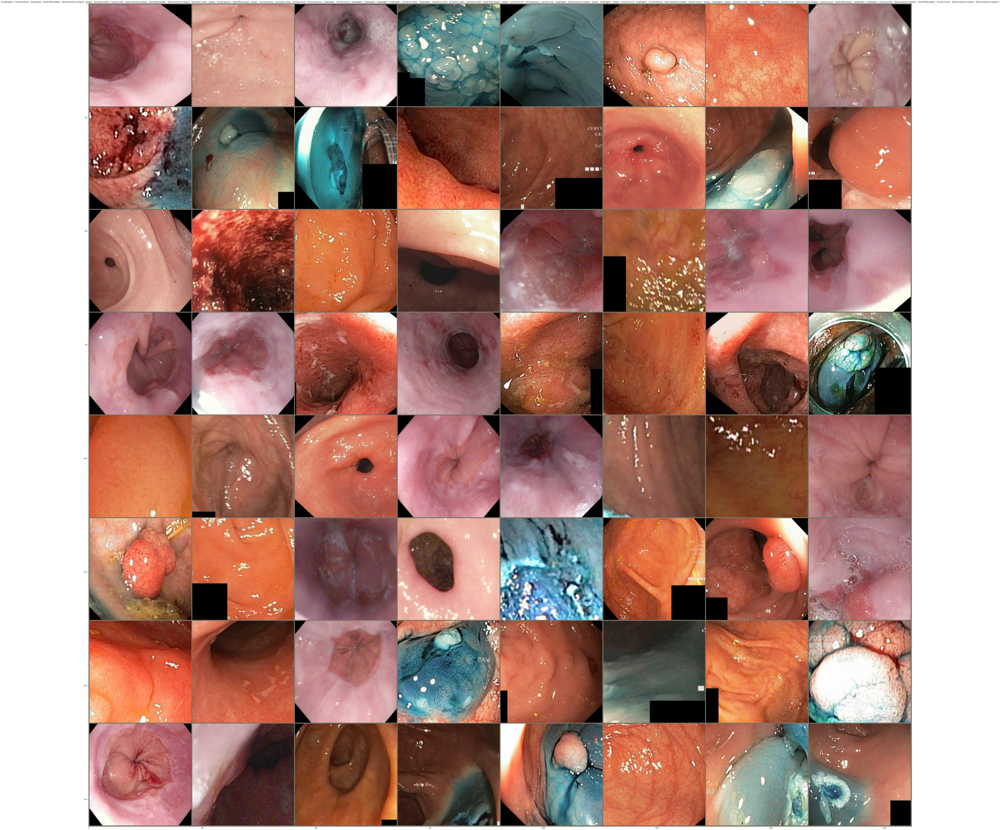

In [15]:
# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [31]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'validation']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'validation' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [38]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['validation']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [16]:
model_ft = models.resnet18(pretrained=True)
num_ftrs = model_ft.fc.in_features
model_ft.fc = nn.Linear(num_ftrs, 8)

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [34]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=25)

Epoch 0/24
----------
train Loss: 1.2064 Acc: 0.5588
validation Loss: 0.5540 Acc: 0.8169

Epoch 1/24
----------
train Loss: 0.5627 Acc: 0.7850
validation Loss: 0.3992 Acc: 0.8456

Epoch 2/24
----------
train Loss: 0.4711 Acc: 0.8133
validation Loss: 0.3467 Acc: 0.8588

Epoch 3/24
----------
train Loss: 0.4123 Acc: 0.8365
validation Loss: 0.3089 Acc: 0.8662

Epoch 4/24
----------
train Loss: 0.3814 Acc: 0.8490
validation Loss: 0.3042 Acc: 0.8850

Epoch 5/24
----------
train Loss: 0.3616 Acc: 0.8513
validation Loss: 0.2690 Acc: 0.8931

Epoch 6/24
----------
train Loss: 0.3388 Acc: 0.8658
validation Loss: 0.2708 Acc: 0.8875

Epoch 7/24
----------
train Loss: 0.3410 Acc: 0.8692
validation Loss: 0.2608 Acc: 0.8944

Epoch 8/24
----------
train Loss: 0.3135 Acc: 0.8792
validation Loss: 0.2588 Acc: 0.8950

Epoch 9/24
----------
train Loss: 0.3149 Acc: 0.8806
validation Loss: 0.2565 Acc: 0.8981

Epoch 10/24
----------
train Loss: 0.3101 Acc: 0.8796
validation Loss: 0.2556 Acc: 0.8969

Epoch 11/

In [37]:
torch.save(model_ft.state_dict(), os.path.join(model_dir,'7_1_resnet18_kavisar_2018_07_16_v1'))

In [17]:
model_ft.load_state_dict(torch.load(os.path.join(model_dir,'7_1_resnet18_kavisar_2018_07_16_v1')))

In [37]:
model_ft = model_ft.to(device)

In [18]:
plt.rcParams['figure.figsize'] = [15, 10]

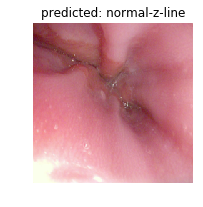

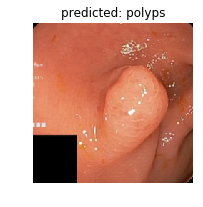

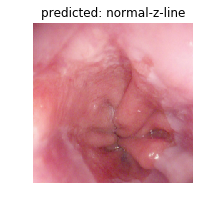

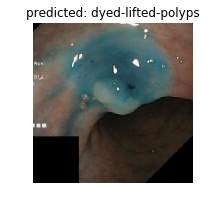

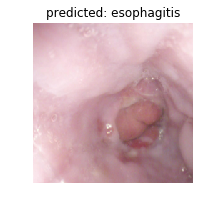

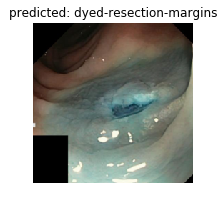

In [45]:
visualize_model(model_ft)

In [19]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [53]:
len(dataloaders['validation'])

25

In [54]:
dataiter = iter(dataloaders['validation'])

In [55]:
images, labels = dataiter.next()

In [59]:
len(images)

64

In [60]:
for images, labels in test_dataloader:
    print(images.shape)
    print(labels.shape)
    

torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([64, 3, 224, 224])
torch.Size([64])
torch.Size([6

In [70]:

for data in dataloaders['validation']:
    images, labels = data
    print("images=",len(images))
    print("labels=",len(labels))

images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64
images= 64
labels= 64


In [24]:
torch.empty(8,8)

tensor(1.00000e-02 *
       [[-0.0000,  0.0000, -0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000],
        [ 0.0000,  0.0000, -0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         -4.0397]])

In [25]:
cm_d = torch.empty(8,8, device=device)

In [29]:
pred_d = torch.empty(8, device=device)

In [30]:
max_d = torch.empty(8, device=device)

In [26]:
cm_d

tensor(1.00000e-45 *
       [[ 1.4013,  0.0000,  5.6052,  0.0000,  0.0000,  0.0000,  2.8026,
          0.0000],
        [ 8.4078,  0.0000,  8.4078,  0.0000,  9.8091,  0.0000,  0.0000,
          0.0000],
        [ 9.8091,  0.0000,  2.8026,  0.0000,  1.4013,  0.0000,  7.0065,
          0.0000],
        [ 0.0000,  0.0000,  7.0065,  0.0000,  7.0065,  0.0000,  4.2039,
          0.0000],
        [ 4.2039,  0.0000,  9.8091,  0.0000,  0.0000,  0.0000,  5.6052,
          0.0000],
        [ 9.8091,  0.0000,  2.8026,  0.0000,  0.0000,  0.0000,  1.4013,
          0.0000],
        [ 7.0065,  0.0000,  4.2039,  0.0000,  0.0000,  0.0000,  5.6052,
          0.0000],
        [ 4.2039,  0.0000,  4.2039,  0.0000,  5.6052,  0.0000,  4.2039,
          0.0000]], device='cuda:0')

## Testing the accuracy of the validation data

In [62]:
correct = 0
total = 0

with torch.no_grad():
    for inputs, labels in test_dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model_ft(inputs)
        _, predicted = torch.max(outputs.data, 1)
        print((predicted == labels).sum())
        total += labels.size(0) 
        #correct += (predicted == labels).sum.item()
        
print('Accuracy of the network on the %d test images: %d %%' % (total, (
    100 * correct / total)))    

tensor(18, device='cuda:0')
tensor(13, device='cuda:0')
tensor(13, device='cuda:0')
tensor(15, device='cuda:0')
tensor(12, device='cuda:0')
tensor(9, device='cuda:0')
tensor(24, device='cuda:0')
tensor(11, device='cuda:0')
tensor(7, device='cuda:0')
tensor(25, device='cuda:0')
tensor(5, device='cuda:0')
tensor(6, device='cuda:0')
tensor(22, device='cuda:0')
tensor(5, device='cuda:0')
tensor(8, device='cuda:0')
tensor(20, device='cuda:0')
tensor(7, device='cuda:0')
tensor(8, device='cuda:0')
tensor(21, device='cuda:0')
tensor(11, device='cuda:0')
tensor(16, device='cuda:0')
tensor(21, device='cuda:0')
tensor(8, device='cuda:0')
tensor(9, device='cuda:0')
tensor(13, device='cuda:0')
Accuracy of the network on the 1600 test images: 0 %


In [101]:
model_ft.eval()
correct = 0
total = 0

with torch.no_grad():
    for inputs, labels in dataloaders['validation']:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model_ft(inputs)
        _, predicted = torch.max(outputs.data, 1)
        print((predicted == labels).sum())
        total += labels.size(0) 
        correct += (predicted == labels).sum()
        
print('Accuracy of the network on the %d test images: %d %%' % (total, (
    100 * correct / total)))   

tensor(53, device='cuda:0')
tensor(55, device='cuda:0')
tensor(56, device='cuda:0')
tensor(59, device='cuda:0')
tensor(50, device='cuda:0')
tensor(56, device='cuda:0')
tensor(59, device='cuda:0')
tensor(58, device='cuda:0')
tensor(54, device='cuda:0')
tensor(57, device='cuda:0')
tensor(59, device='cuda:0')
tensor(58, device='cuda:0')
tensor(57, device='cuda:0')
tensor(58, device='cuda:0')
tensor(57, device='cuda:0')
tensor(52, device='cuda:0')
tensor(50, device='cuda:0')
tensor(58, device='cuda:0')
tensor(57, device='cuda:0')
tensor(54, device='cuda:0')
tensor(53, device='cuda:0')
tensor(58, device='cuda:0')
tensor(54, device='cuda:0')
tensor(57, device='cuda:0')
tensor(58, device='cuda:0')
Accuracy of the network on the 1600 test images: 87 %


In [103]:
model_ft.eval()
correct = 0
total = 0

with torch.no_grad():
    for inputs, labels in test_dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model_ft(inputs)
        _, predicted = torch.max(outputs.data, 1)
        print((predicted == labels).sum())
        total += labels.size(0) 
        correct += (predicted == labels).sum()
        
print('Accuracy of the network on the %d test images: %d %%' % (total, (
    100 * correct / total)))    

tensor(59, device='cuda:0')
tensor(61, device='cuda:0')
tensor(57, device='cuda:0')
tensor(57, device='cuda:0')
tensor(61, device='cuda:0')
tensor(57, device='cuda:0')
tensor(55, device='cuda:0')
tensor(46, device='cuda:0')
tensor(48, device='cuda:0')
tensor(54, device='cuda:0')
tensor(61, device='cuda:0')
tensor(63, device='cuda:0')
tensor(62, device='cuda:0')
tensor(61, device='cuda:0')
tensor(62, device='cuda:0')
tensor(56, device='cuda:0')
tensor(58, device='cuda:0')
tensor(58, device='cuda:0')
tensor(55, device='cuda:0')
tensor(56, device='cuda:0')
tensor(56, device='cuda:0')
tensor(56, device='cuda:0')
tensor(59, device='cuda:0')
tensor(60, device='cuda:0')
tensor(55, device='cuda:0')
Accuracy of the network on the 1600 test images: 89 %


In [102]:
cm =0
with torch.no_grad():
    for data in test_dataloader:
        images_h, labels_h = data
        images_d = images_h.to(device)
        #labels_d = labels_h.to(device)
        output_d = model_ft(images_d)
        #output_h = output_d.to('cpu')
       # _, predicted = torch.max(output_d, 1)
        max_d, pred_d = torch.max(output_d, 1)
        pred_h = pred_d.to('cpu')
       # cm_d += confusion_matrix(labels_d, pred_d)
       # print(labels_h.size())
       # print(pred_d.size())
        cm = confusion_matrix(labels_h, pred_h)
        print(cm)

    

[[59  5]
 [ 0  0]]
[[61  3]
 [ 0  0]]
[[57  7]
 [ 0  0]]
[[ 8  0]
 [ 7 49]]
[[ 0  0]
 [ 3 61]]
[[ 0  0]
 [ 7 57]]
[[ 0  0  0  0]
 [ 2 14  0  0]
 [ 0  0 41  7]
 [ 0  0  0  0]]
[[46 18]
 [ 0  0]]
[[48 16]
 [ 0  0]]
[[15  0  9  0]
 [ 0 39  0  1]
 [ 0  0  0  0]
 [ 0  0  0  0]]
[[61  2  1]
 [ 0  0  0]
 [ 0  0  0]]
[[63  1]
 [ 0  0]]
[[ 0  0  0  0]
 [ 0  0  0  0]
 [ 0  0 32  0]
 [ 1  1  0 30]]
[[ 0  0  0]
 [ 1 61  2]
 [ 0  0  0]]
[[ 0  0]
 [ 2 62]]
[[ 0  0  0]
 [ 2 36  2]
 [ 4  0 20]]
[[ 0  0]
 [ 6 58]]
[[ 0  0]
 [ 6 58]]
[[ 0  0  0  0  0  0]
 [ 0  0  0  0  0  0]
 [ 0  0  0  0  0  0]
 [ 0  0  0  0  0  0]
 [ 0  0  5  0 43  0]
 [ 2  1  0  1  0 12]]
[[ 0  0  0  0  0  0]
 [ 0  0  0  0  0  0]
 [ 0  0  0  0  0  0]
 [ 0  0  0  0  0  0]
 [ 3  1  2  1 56  1]
 [ 0  0  0  0  0  0]]
[[ 0  0  0  0  0]
 [ 0  0  0  0  0]
 [ 0  0  0  0  0]
 [ 3  3  1 56  1]
 [ 0  0  0  0  0]]
[[ 0  0  0  0  0]
 [ 0  0  0  0  0]
 [ 0  0  0  0  0]
 [ 2  1  3 50  0]
 [ 0  0  1  1  6]]
[[ 0  0]
 [ 5 59]]
[[ 0  0  0  0]
 [ 0  0 

In [83]:
outputs = model_ft(inputs)
    _, preds = torch.max(outputs, 1)

IndentationError: unexpected indent (<ipython-input-83-f60d096d0369>, line 2)

In [57]:
cm = confusion_matrix(labels, preds)

In [58]:
cm

array([[ 5,  0,  0,  0,  0,  0,  0,  0],
       [ 1,  3,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  5,  0,  0,  3,  0,  0],
       [ 0,  0,  0,  9,  0,  0,  0,  0],
       [ 0,  0,  0,  0, 11,  0,  0,  0],
       [ 0,  0,  3,  0,  0,  8,  0,  0],
       [ 1,  0,  0,  0,  1,  0, 11,  0],
       [ 0,  0,  1,  0,  0,  0,  0,  2]])

In [105]:
t1 = torch.tensor([])

In [106]:
t1

tensor([])

In [109]:
t2 = torch.rand(3)

In [110]:
t2

tensor([ 0.3822,  0.6611,  0.8028])

In [112]:
t3 =torch.cat((t1,t2),0)

In [113]:
t3

tensor([ 0.3822,  0.6611,  0.8028])

In [114]:
t3 = torch.cat((t3, t2),0)

In [115]:
t3

tensor([ 0.3822,  0.6611,  0.8028,  0.3822,  0.6611,  0.8028])